<a href="https://colab.research.google.com/github/ayaamr11/DistractedDriverDetection-CV/blob/main/DistractedDriverDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Setup

## Read data from Kaggle API

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files
upload = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle competitions download -c state-farm-distracted-driver-detection


100% 3.99G/4.00G [00:34<00:00, 78.0MB/s]
100% 4.00G/4.00G [00:35<00:00, 123MB/s] 


In [ ]:
! unzip state-farm-distracted-driver-detection

Streaming output truncated to the last 5000 lines.
  inflating: imgs/train/c7/img_56636.jpg  
  inflating: imgs/train/c7/img_56661.jpg  
  inflating: imgs/train/c7/img_56699.jpg  
  inflating: imgs/train/c7/img_56717.jpg  
  inflating: imgs/train/c7/img_56724.jpg  
  inflating: imgs/train/c7/img_56768.jpg  
  inflating: imgs/train/c7/img_56779.jpg  
  inflating: imgs/train/c7/img_56849.jpg  
  inflating: imgs/train/c7/img_56899.jpg  
  inflating: imgs/train/c7/img_56938.jpg  
  inflating: imgs/train/c7/img_5706.jpg  
  inflating: imgs/train/c7/img_57076.jpg  
  inflating: imgs/train/c7/img_57122.jpg  
  inflating: imgs/train/c7/img_57137.jpg  
  inflating: imgs/train/c7/img_5715.jpg  
  inflating: imgs/train/c7/img_57278.jpg  
  inflating: imgs/train/c7/img_57321.jpg  
  inflating: imgs/train/c7/img_57345.jpg  
  inflating: imgs/train/c7/img_57355.jpg  
  inflating: imgs/train/c7/img_5741.jpg  
  inflating: imgs/train/c7/img_57433.jpg  
  inflating: imgs/train/c7/img_5753.jpg  
  infla

## Import Libararies

In [ ]:
import os
import numpy as np
import pandas as pd
import cv2
import random
import tqdm
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.optimizers import Adam,RMSprop
from tensorflow.keras import models
from tensorflow.keras import layers
from keras.preprocessing import image                  
from PIL import Image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense,
    Conv2D,
    MaxPool2D,
    Flatten,
    Dropout,
    BatchNormalization,
)


# Data Exploration and preperation

In [ ]:
train_df = pd.read_csv('/content/driver_imgs_list.csv')
train_df['path'] = '/content/imgs/train/' + train_df['classname']+ '/' +train_df['img']
pred_df = pd.read_csv('/content/sample_submission.csv')
pred_df['path'] = '/content/imgs/test/' + pred_df['img']

train_df=train_df[['path','classname']]

In [ ]:
pred_df.head()

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,path
0,img_1.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,/content/imgs/test/img_1.jpg
1,img_10.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,/content/imgs/test/img_10.jpg
2,img_100.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,/content/imgs/test/img_100.jpg
3,img_1000.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,/content/imgs/test/img_1000.jpg
4,img_100000.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,/content/imgs/test/img_100000.jpg


In [ ]:
# Build data frame (path , label)
train_df.sample(10)

,path,classname
21249,/content/imgs/train/c5/img_80483.jpg,c5
21647,/content/imgs/train/c0/img_31076.jpg,c0
4438,/content/imgs/train/c0/img_8941.jpg,c0
9873,/content/imgs/train/c6/img_81863.jpg,c6
3336,/content/imgs/train/c0/img_31110.jpg,c0
5323,/content/imgs/train/c7/img_22875.jpg,c7
5296,/content/imgs/train/c7/img_38925.jpg,c7
2978,/content/imgs/train/c6/img_66130.jpg,c6
13774,/content/imgs/train/c2/img_6965.jpg,c2
21556,/content/imgs/train/c9/img_80387.jpg,c9


(480, 640, 3)


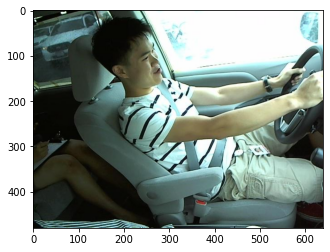

In [ ]:
img = cv2.imread(train_df['path'][0]) 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)
plt.imshow(img)

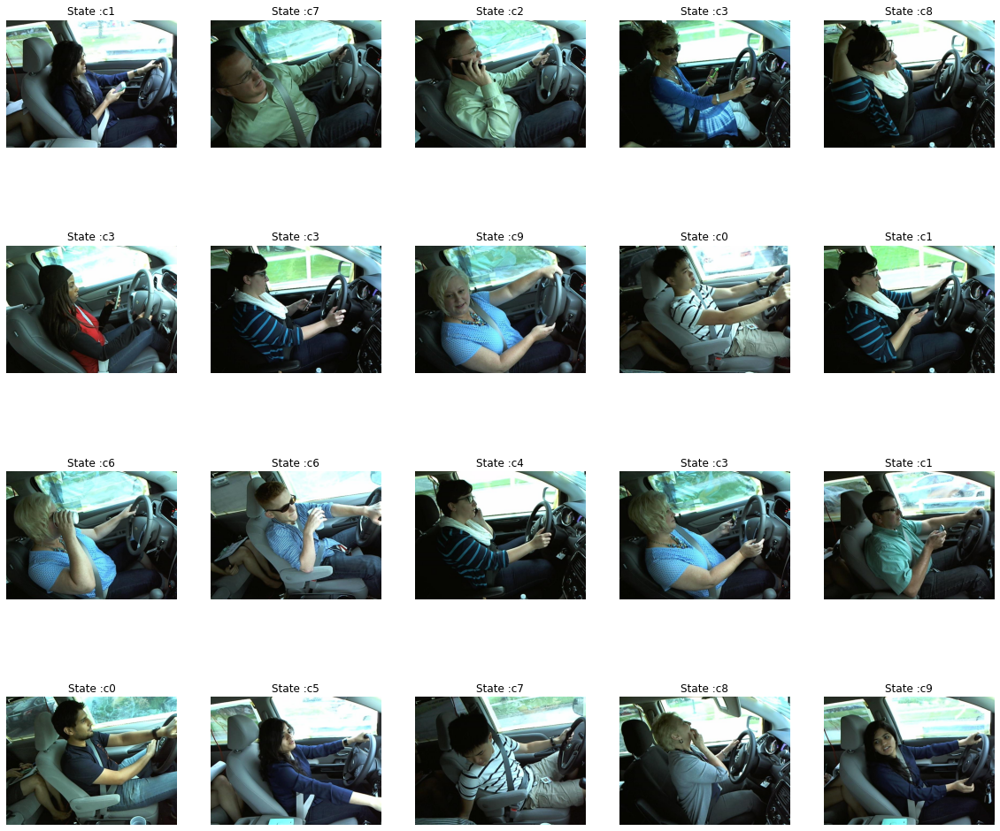

In [ ]:
# Draw sample of images
fig = plt.figure(figsize=(20,18)) 
cols,rows = 5,4                   
for i in range(1,cols*rows+1):
    pic_indx = random.randint(0,train_df.shape[0])
    img = Image.open((train_df.loc[pic_indx,'path']))
    fig.add_subplot(rows,cols,i)
    plt.imshow(img)
    plt.title('State :'+ train_df.loc[pic_indx,'classname'])
    plt.axis('off')

plt.show()

In [ ]:
train_df['classname'].value_counts()

c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: classname, dtype: int64

In [ ]:
labels_list = list(set(train_df['classname'].values.tolist()))
labels_id = {label_name:id for id,label_name in enumerate(labels_list)}
print(labels_id)
train_df['classname'].replace(labels_id,inplace=True)
labels = to_categorical(train_df['classname'])
labels.shape

{'c1': 0, 'c2': 1, 'c9': 2, 'c6': 3, 'c7': 4, 'c5': 5, 'c4': 6, 'c0': 7, 'c8': 8, 'c3': 9}


(22424, 10)

In [ ]:
from sklearn.model_selection import train_test_split
# Split data
x_t, x_v, y_train, y_val = train_test_split(train_df.iloc[:,0],labels,test_size = 0.2,random_state=42,shuffle=True)

In [ ]:
# x_t[1]

In [ ]:
# Read images and transform to array
train=[]
for i in x_t:
  img = image.load_img(i,target_size=(64,64,3))
  img = image.img_to_array(img)
  img = img/255
  train.append(img)

In [ ]:
# train[0:1]

In [ ]:
X_train=np.array(train)

In [ ]:
X_train.shape

(17939, 64, 64, 3)

In [ ]:
val=[]
for i in x_v:
  img = image.load_img(i,target_size=(64,64,3))
  img = image.img_to_array(img)
  img = img/255
  val.append(img)

In [ ]:
X_val=np.array(val)

In [ ]:
X_val.shape

(4485, 64, 64, 3)

In [ ]:
X_train_Dense =  X_train.reshape(-1,64*64*3)
X_val_Dense =  X_val.reshape(-1,64*64*3)

In [ ]:
num_classes = 10

In [ ]:
X_train_Dense.shape

(17939, 12288)

# Build base line model

In [ ]:
network = models.Sequential()
network.add(layers.Dense(128, activation='relu', name='Layer_1', input_shape=(64*64*3,)))
network.add(layers.Dense(64, activation='relu', name='Layer_4'))
network.add(layers.Dense(32, activation='relu', name='Layer_6'))
network.add(layers.Dense(10, activation='softmax'))

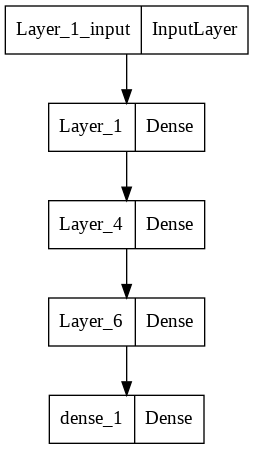

In [ ]:
plot_model(network)

In [ ]:
network.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer_1 (Dense)             (None, 128)               1572992   
                                                                 
 Layer_4 (Dense)             (None, 64)                8256      
                                                                 
 Layer_6 (Dense)             (None, 32)                2080      
                                                                 
 dense_1 (Dense)             (None, 10)                330       
                                                                 
Total params: 1,583,658
Trainable params: 1,583,658
Non-trainable params: 0
_________________________________________________________________


In [ ]:
network.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
mod=network.fit(X_train_Dense, y_train, epochs=5, batch_size=64)

Epoch 1/5
281/281 [==============================] - 2s 4ms/step - loss: 1.3453 - accuracy: 0.5643
Epoch 2/5
281/281 [==============================] - 1s 4ms/step - loss: 0.4040 - accuracy: 0.8989
Epoch 3/5
281/281 [==============================] - 1s 4ms/step - loss: 0.2191 - accuracy: 0.9421
Epoch 4/5
281/281 [==============================] - 1s 4ms/step - loss: 0.1420 - accuracy: 0.9613
Epoch 5/5
281/281 [==============================] - 1s 4ms/step - loss: 0.1023 - accuracy: 0.9720


In [ ]:
vtest_loss, test_acc = network.evaluate(X_val_Dense,y_val)

141/141 [==============================] - 1s 4ms/step - loss: 0.3054 - accuracy: 0.8941


#  Baseline CNN model

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense,
    Conv2D,
    MaxPool2D,
    Flatten,
    Dropout,
    BatchNormalization,
)

model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(64, 64, 3)))
model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation="relu"))
model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))
model.add(Flatten())
model.add(Dense(units=128, activation="relu"))
model.add(Dense(units=64, activation="relu"))

model.add(Dropout(0.3))
model.add(Dense(units=num_classes, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 62, 62, 256)       7168      
                                                                 
 batch_normalization_3 (Batc  (None, 62, 62, 256)      1024      
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 31, 31, 256)      0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 29, 29, 128)       295040    
                                                                 
 dropout_2 (Dropout)         (None, 29, 29, 128)       0         
                                                                 
 batch_normalization_4 (Batc  (None, 29, 29, 128)     

In [ ]:
model.compile(loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
model.fit(X_train, y_train, epochs=10, verbose=1, validation_data=(X_val, y_val))

Epoch 1/10
561/561 [==============================] - 21s 34ms/step - loss: 0.9356 - accuracy: 0.6832 - val_loss: 2.2592 - val_accuracy: 0.5543
Epoch 2/10
561/561 [==============================] - 17s 30ms/step - loss: 0.1954 - accuracy: 0.9455 - val_loss: 0.2350 - val_accuracy: 0.9394
Epoch 3/10
561/561 [==============================] - 17s 30ms/step - loss: 0.1221 - accuracy: 0.9673 - val_loss: 0.0659 - val_accuracy: 0.9813
Epoch 4/10
561/561 [==============================] - 17s 30ms/step - loss: 0.0850 - accuracy: 0.9783 - val_loss: 0.0645 - val_accuracy: 0.9846
Epoch 5/10
561/561 [==============================] - 17s 29ms/step - loss: 0.0680 - accuracy: 0.9824 - val_loss: 0.1443 - val_accuracy: 0.9688
Epoch 6/10
561/561 [==============================] - 17s 30ms/step - loss: 0.0589 - accuracy: 0.9849 - val_loss: 0.1757 - val_accuracy: 0.9699
Epoch 7/10
561/561 [==============================] - 16s 29ms/step - loss: 0.0558 - accuracy: 0.9877 - val_loss: 0.1169 - val_accuracy:

# Data Augmentation

In [ ]:
train_datagen = ImageDataGenerator(
                                  #rotation_range=40,
                                  zoom_range=0.2,
                                  shear_range = 0.2,
                                  horizontal_flip=True,
                                  fill_mode='nearest', 
                                  validation_split = 0.2)

validation_datagen = ImageDataGenerator(validation_split = 0.2)


In [ ]:
train_datagen.fit(X_train)

In [ ]:
train_generator = train_datagen.flow(X_train,y_train,batch_size=64)

validation_generator=validation_datagen.flow( X_val , y_val , batch_size=64)

# Model with Data Augmentation

In [ ]:
model = Sequential()

model.add(Conv2D(512, (3, 3), activation="relu", input_shape=(64, 64, 3)))
model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))

model.add(Conv2D(512, (3, 3), activation="relu",padding='same'))
model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))

model.add(Conv2D(256, (3, 3), activation="relu",padding='same'))
model.add(Dropout(0.3))
# model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))

model.add(Conv2D(128, (3, 3), activation="relu",padding='same'))
model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))

model.add(Conv2D(128, (3, 3), activation="relu",padding='same'))
model.add(Dropout(0.4))
# model.add(BatchNormalization())
model.add(MaxPool2D((2, 2)))


model.add(Conv2D(64, (3, 3), activation="relu",padding='same'))
# model.add(MaxPool2D((2, 2)))

model.add(Flatten())
model.add(Dense(units=128, activation="relu"))
model.add(Dense(units=64, activation="relu"))

model.add(Dropout(0.3))
model.add(Dense(10, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 62, 62, 512)       14336     
                                                                 
 batch_normalization_25 (Bat  (None, 62, 62, 512)      2048      
 chNormalization)                                                
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 31, 31, 512)      0         
 g2D)                                                            
                                                                 
 conv2d_43 (Conv2D)          (None, 31, 31, 512)       2359808   
                                                                 
 batch_normalization_26 (Bat  (None, 31, 31, 512)      2048      
 chNormalization)                                                
                                                      

In [ ]:
model.compile(optimizer= 'Adam' , loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
history3=model.fit(train_generator, epochs=25,validation_data=(X_val , y_val))

Epoch 1/25
281/281 [==============================] - 50s 174ms/step - loss: 2.2301 - accuracy: 0.1496 - val_loss: 2.6210 - val_accuracy: 0.1057
Epoch 2/25
281/281 [==============================] - 49s 173ms/step - loss: 1.6232 - accuracy: 0.3802 - val_loss: 2.2421 - val_accuracy: 0.2303
Epoch 3/25
281/281 [==============================] - 46s 163ms/step - loss: 1.1806 - accuracy: 0.5723 - val_loss: 0.9952 - val_accuracy: 0.6421
Epoch 4/25
281/281 [==============================] - 48s 171ms/step - loss: 0.8770 - accuracy: 0.6971 - val_loss: 0.7912 - val_accuracy: 0.6936
Epoch 5/25
281/281 [==============================] - 46s 163ms/step - loss: 0.6828 - accuracy: 0.7657 - val_loss: 0.5475 - val_accuracy: 0.8100
Epoch 6/25
281/281 [==============================] - 48s 171ms/step - loss: 0.5434 - accuracy: 0.8274 - val_loss: 0.6301 - val_accuracy: 0.7759
Epoch 7/25
281/281 [==============================] - 48s 171ms/step - loss: 0.4529 - accuracy: 0.8558 - val_loss: 0.3282 - val_ac

# Transfer Learning

## **transfer learning with augmented data**

In [ ]:
base_model = keras.applications.VGG16(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(64, 64, 3),
    include_top=False)

58900480/58889256 [==============================] - 2s 0us/step


In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 64, 64, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 64, 64, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 32, 32, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 32, 32, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 32, 32, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 16, 16, 128)       0     

In [ ]:
base_model.trainable = False

In [ ]:
inputs = keras.Input(shape=(64, 64, 3))
# Separately from setting trainable on the model, we set training to False 
x = base_model(inputs, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x =  keras.layers.Dense(1024, activation='relu')(x)

outputs = keras.layers.Dense(10)(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 vgg16 (Functional)          (None, 2, 2, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              525312    
                                                                 
 dense_1 (Dense)             (None, 10)                10250     
                                                                 
Total params: 15,250,250
Trainable params: 535,562
Non-trainable params: 14,714,688
___________________________________________

In [ ]:
model.compile(loss=keras.losses.CategoricalCrossentropy(from_logits=True), metrics=[keras.metrics.CategoricalAccuracy()])

In [ ]:
model.fit(train_generator, steps_per_epoch=20, validation_data=(X_val, y_val), validation_steps=4, epochs=25)

Epoch 1/25
20/20 [==============================] - 16s 817ms/step - loss: 1.1314 - categorical_accuracy: 0.5938 - val_loss: 1.0522 - val_categorical_accuracy: 0.6185
Epoch 2/25
20/20 [==============================] - 3s 164ms/step - loss: 1.0803 - categorical_accuracy: 0.6297 - val_loss: 1.2868 - val_categorical_accuracy: 0.5414
Epoch 3/25
20/20 [==============================] - 3s 164ms/step - loss: 1.1310 - categorical_accuracy: 0.6062 - val_loss: 0.9849 - val_categorical_accuracy: 0.6595
Epoch 4/25
20/20 [==============================] - 3s 165ms/step - loss: 1.0498 - categorical_accuracy: 0.6414 - val_loss: 0.9460 - val_categorical_accuracy: 0.6644
Epoch 5/25
20/20 [==============================] - 3s 162ms/step - loss: 1.0534 - categorical_accuracy: 0.6430 - val_loss: 0.9932 - val_categorical_accuracy: 0.6482
Epoch 6/25
20/20 [==============================] - 3s 166ms/step - loss: 1.0274 - categorical_accuracy: 0.6508 - val_loss: 1.0817 - val_categorical_accuracy: 0.6111
Epo

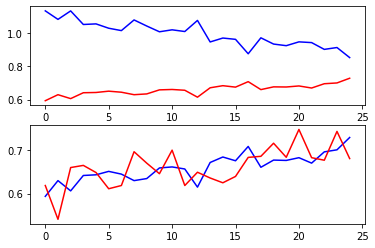

In [ ]:
#Plotting the training and validation loss and accuracy
f,ax=plt.subplots(2,1)
#Loss
ax[0].plot(model.history.history['loss'],color='b',label='Training Loss')
ax[0].plot(model.history.history['categorical_accuracy'],color='r',label='val_categorical_accuracy')

#Accuracy
ax[1].plot(model.history.history['categorical_accuracy'],color='b',label='Training  Accuracy')
ax[1].plot(model.history.history['val_categorical_accuracy'],color='r',label='Validation Accuracy')

In [ ]:
# Unfreeze the base model
base_model.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are taken into account
model.compile(optimizer=keras.optimizers.RMSprop(learning_rate = .00001),  # Very low learning rate
              loss=keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])

In [ ]:
model.fit(train_generator, steps_per_epoch=20, validation_data=(X_val, y_val), validation_steps=4, epochs=20)

Epoch 1/20
20/20 [==============================] - 12s 320ms/step - loss: 1.1647 - categorical_accuracy: 0.6305 - val_loss: 0.6808 - val_categorical_accuracy: 0.7670
Epoch 2/20
20/20 [==============================] - 6s 276ms/step - loss: 0.8566 - categorical_accuracy: 0.7133 - val_loss: 0.6846 - val_categorical_accuracy: 0.7521
Epoch 3/20
20/20 [==============================] - 4s 207ms/step - loss: 0.7262 - categorical_accuracy: 0.7531 - val_loss: 0.6100 - val_categorical_accuracy: 0.7938
Epoch 4/20
20/20 [==============================] - 4s 186ms/step - loss: 0.7020 - categorical_accuracy: 0.7680 - val_loss: 0.5345 - val_categorical_accuracy: 0.8185
Epoch 5/20
20/20 [==============================] - 4s 188ms/step - loss: 0.6396 - categorical_accuracy: 0.7922 - val_loss: 0.7491 - val_categorical_accuracy: 0.7503
Epoch 6/20
20/20 [==============================] - 4s 189ms/step - loss: 0.5904 - categorical_accuracy: 0.8062 - val_loss: 0.4778 - val_categorical_accuracy: 0.8437
Epo

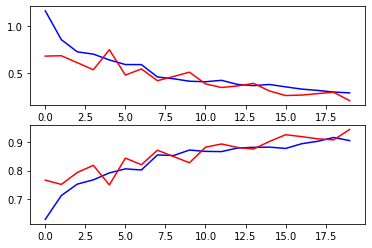

In [ ]:
#Plotting the training and validation loss and accuracy
f,ax=plt.subplots(2,1)
#Loss
ax[0].plot(model.history.history['loss'],color='b',label='Training Loss')
ax[0].plot(model.history.history['val_loss'],color='r',label='Validation Loss')

#Accuracy
ax[1].plot(model.history.history['categorical_accuracy'],color='b',label='Training  Accuracy')
ax[1].plot(model.history.history['val_categorical_accuracy'],color='r',label='Validation Accuracy')

## **transfer learning without data augmentation**

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.layers import GlobalAveragePooling2D
from keras import Sequential, Model


nb_classes = 10
# Remove fully connected layer and replace
vgg16_model = VGG16(weights="imagenet", include_top=False)

for layer in vgg16_model.layers:
  layer.trainable = False
    
x = vgg16_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
    
predictions = Dense(nb_classes, activation = 'softmax')(x) # add dense layer with 10 neurons and activation softmax
model = Model(vgg16_model.input,predictions)

In [ ]:
model.summary()
model.compile(loss='categorical_crossentropy',
                         optimizer='Adam',
                         metrics=['accuracy'])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [ ]:
model.fit(X_train, y_train, steps_per_epoch=12, validation_data=(X_val, y_val), validation_steps=4, epochs=25)

Epoch 1/25
12/12 [==============================] - 38s 2s/step - loss: 2.1800 - accuracy: 0.2320 - val_loss: 1.9436 - val_accuracy: 0.3853
Epoch 2/25
12/12 [==============================] - 8s 717ms/step - loss: 1.7708 - accuracy: 0.4669 - val_loss: 1.6223 - val_accuracy: 0.5179
Epoch 3/25
12/12 [==============================] - 9s 726ms/step - loss: 1.4791 - accuracy: 0.5800 - val_loss: 1.3760 - val_accuracy: 0.6069
Epoch 4/25
12/12 [==============================] - 9s 734ms/step - loss: 1.2540 - accuracy: 0.6523 - val_loss: 1.1785 - val_accuracy: 0.6740
Epoch 5/25
12/12 [==============================] - 9s 736ms/step - loss: 1.0876 - accuracy: 0.7015 - val_loss: 1.0395 - val_accuracy: 0.7139
Epoch 6/25
12/12 [==============================] - 9s 747ms/step - loss: 0.9582 - accuracy: 0.7409 - val_loss: 0.9284 - val_accuracy: 0.7385
Epoch 7/25
12/12 [==============================] - 9s 751ms/step - loss: 0.8584 - accuracy: 0.7643 - val_loss: 0.8377 - val_accuracy: 0.7726
Epoch 8/

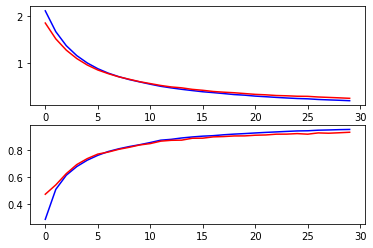

In [ ]:
#Plotting the training and validation loss and accuracy
f,ax=plt.subplots(2,1)
#Loss
ax[0].plot(model.history.history['loss'],color='b',label='Training Loss')
ax[0].plot(model.history.history['val_loss'],color='r',label='Validation Loss')

#Accuracy
ax[1].plot(model.history.history['accuracy'],color='b',label='Training  Accuracy')
ax[1].plot(model.history.history['val_accuracy'],color='r',label='Validation Accuracy')

In [ ]:
# Unfreeze the base model
for layer in vgg16_model.layers:
  layer.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are taken into account
model.compile(optimizer=keras.optimizers.RMSprop(learning_rate = .00001),  # Very low learning rate
              loss=keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])

In [ ]:
model.fit(X_train, y_train, steps_per_epoch=12, validation_data=(X_val, y_val), validation_steps=4, epochs=10)

Epoch 1/10


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


12/12 [==============================] - 51s 3s/step - loss: 1.0308 - categorical_accuracy: 0.7978 - val_loss: 0.2256 - val_categorical_accuracy: 0.9389
Epoch 2/10
12/12 [==============================] - 23s 2s/step - loss: 0.1539 - categorical_accuracy: 0.9603 - val_loss: 0.1943 - val_categorical_accuracy: 0.9463
Epoch 3/10
12/12 [==============================] - 23s 2s/step - loss: 0.5407 - categorical_accuracy: 0.8456 - val_loss: 0.1761 - val_categorical_accuracy: 0.9536
Epoch 4/10
12/12 [==============================] - 23s 2s/step - loss: 0.1105 - categorical_accuracy: 0.9727 - val_loss: 0.1537 - val_categorical_accuracy: 0.9574
Epoch 5/10
12/12 [==============================] - 23s 2s/step - loss: 0.0961 - categorical_accuracy: 0.9774 - val_loss: 0.2244 - val_categorical_accuracy: 0.9298
Epoch 6/10
12/12 [==============================] - 23s 2s/step - loss: 0.3971 - categorical_accuracy: 0.8966 - val_loss: 0.1295 - val_categorical_accuracy: 0.9634
Epoch 7/10
12/12 [=========

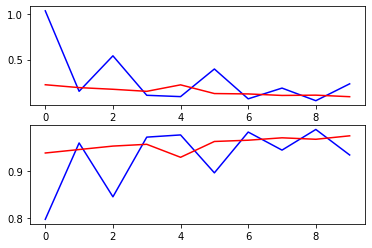

In [ ]:
# Plotting the training and validation loss and accuracy
f,ax=plt.subplots(2,1)
#Loss
ax[0].plot(model.history.history['loss'],color='b',label='Training Loss')
ax[0].plot(model.history.history['val_loss'],color='r',label='Validation Loss')

#Accuracy
ax[1].plot(model.history.history['categorical_accuracy'],color='b',label='Training  Accuracy')
ax[1].plot(model.history.history['val_categorical_accuracy'],color='r',label='Validation Accuracy')



```
# This is formatted as code
```

## **CNN visualization**

## Visualizing intermediate activations


#### Image preprocessing

In [ ]:
img_path = '/content/imgs/train/c0/img_100026.jpg'

# We preprocess the image into a 4D tensor
# from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions

import numpy as np

img = image.load_img(img_path, target_size=(240, 240))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 240, 240, 3)


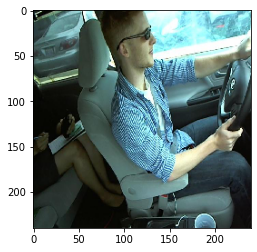

In [ ]:
plt.imshow(img_tensor[0])
plt.show()

#### Model

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.layers import GlobalAveragePooling2D
from keras import Sequential, Model


nb_classes = 10
# Remove fully connected layer and replace
vgg16_model = VGG16(weights="imagenet", include_top=False)

for layer in vgg16_model.layers:
  layer.trainable = False
    
x = vgg16_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
    
predictions = Dense(nb_classes, activation = 'softmax')(x) # add dense layer with 10 neurons and activation softmax
model = Model(vgg16_model.input,predictions)



58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
model.summary()
model.compile(loss='categorical_crossentropy',
                         optimizer='Adam',
                         metrics=['accuracy'])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

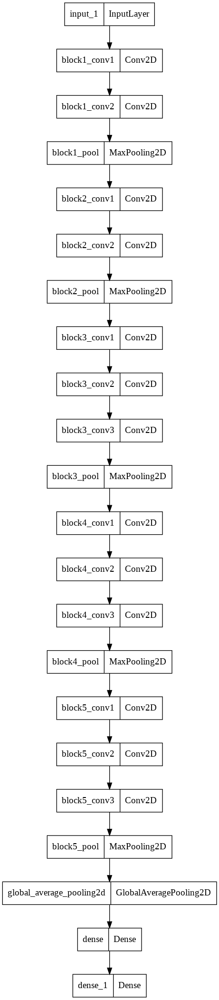

In [ ]:
plot_model(model)

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:10]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
activation_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0   

In [ ]:
activations = activation_model.predict(img_tensor)

In [ ]:
len(activations)

10

In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 240, 240, 3)


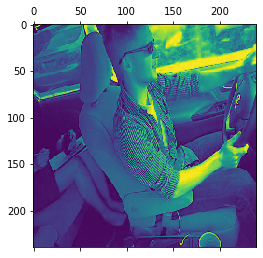

In [ ]:
#trying first channel
plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
plt.show()

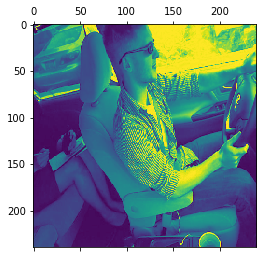

In [ ]:
#trying second channel
plt.matshow(first_layer_activation[0, :, :, 1], cmap='viridis')
plt.show()

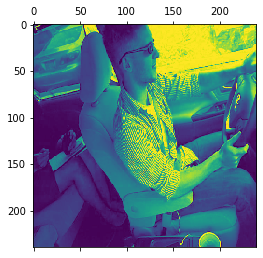

In [ ]:
#trying 3rd channel
plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis')
plt.show()# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

In [ ]:
layer_names

['input_1',
 'block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1']

#### Output: feature maps

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide


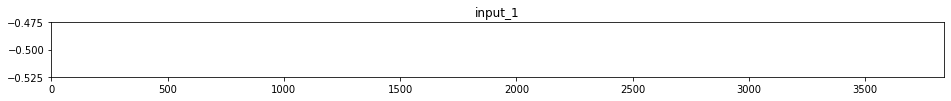

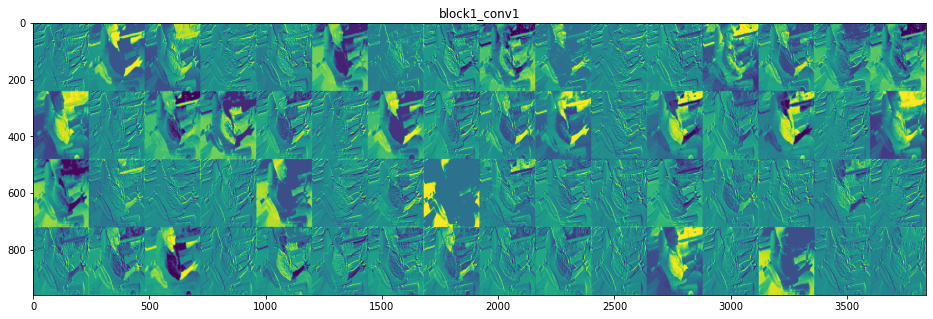

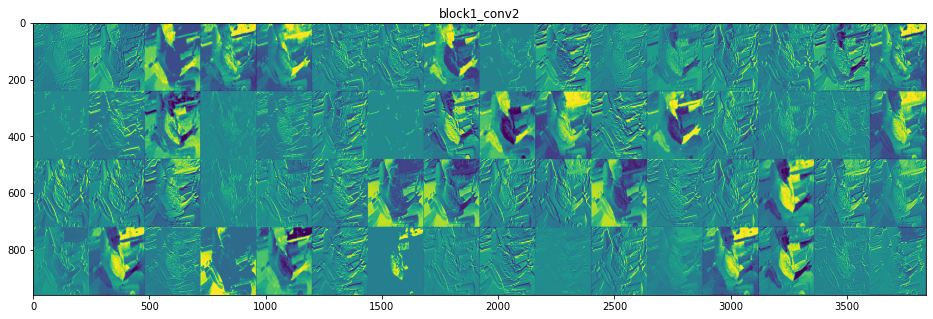

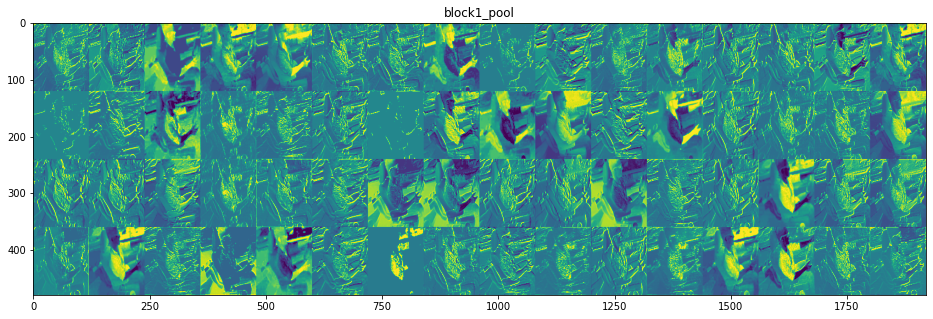

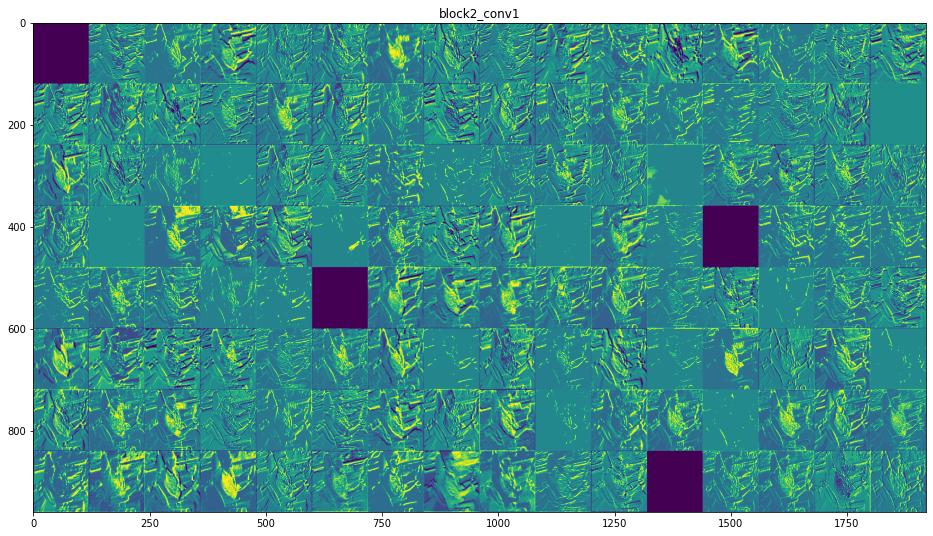

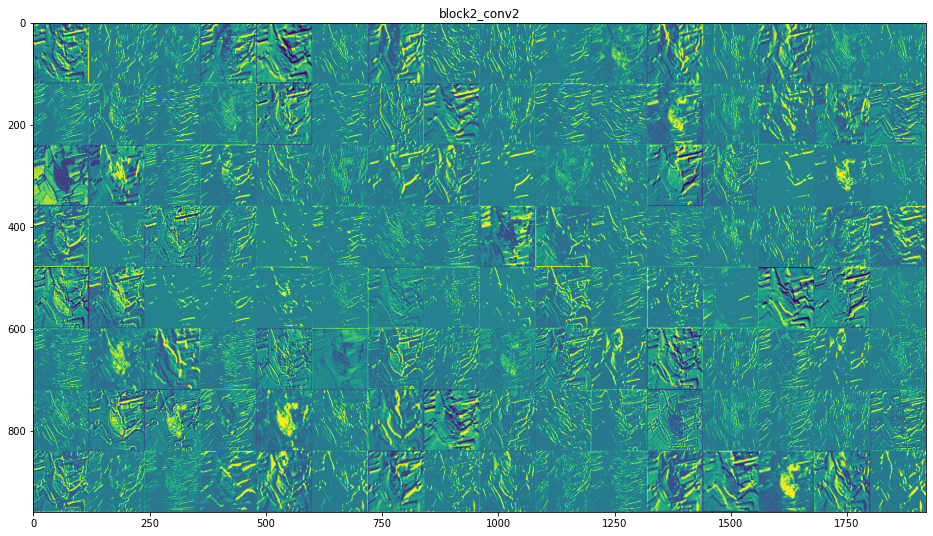

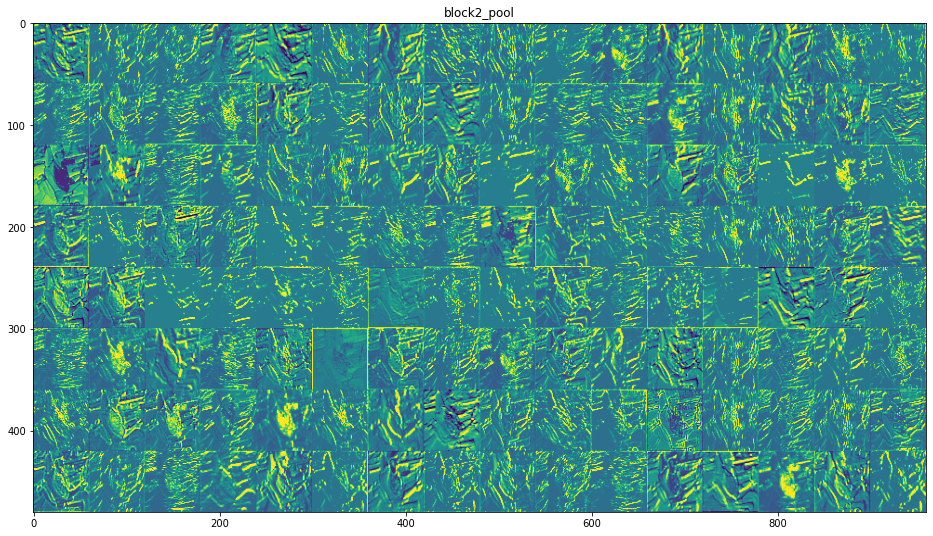

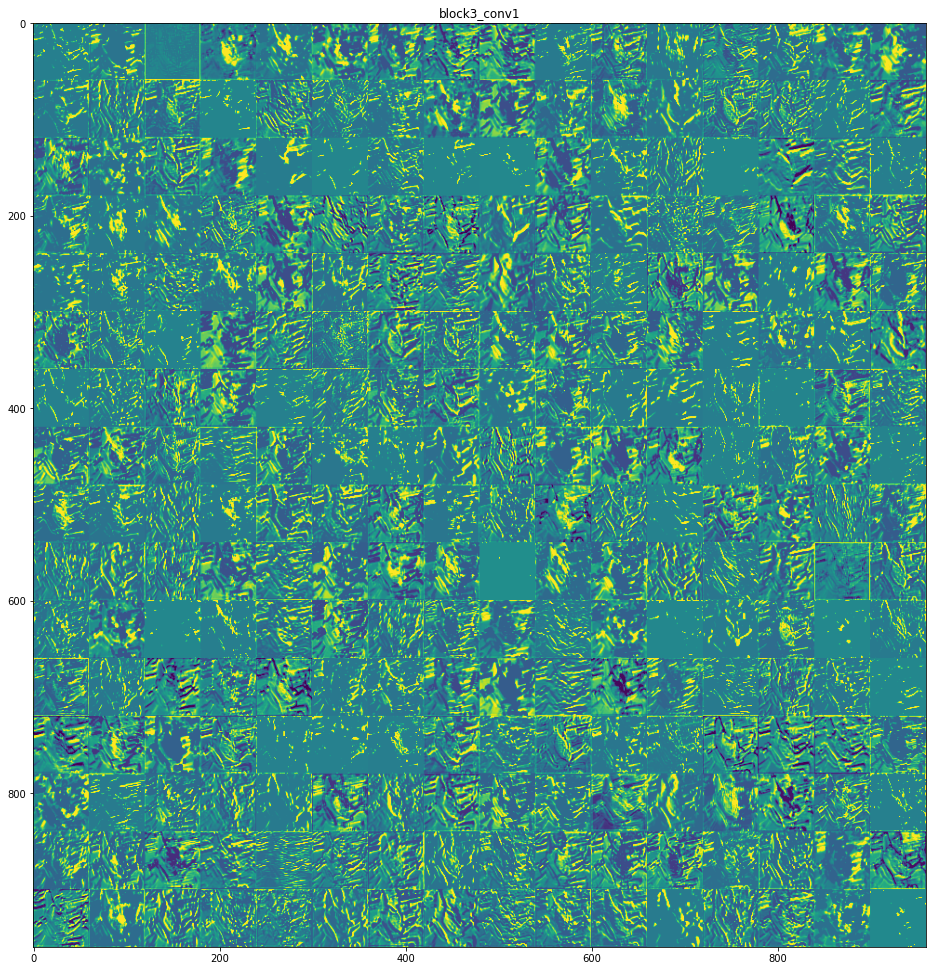

In [ ]:
images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]
    
    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]
   
    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
   

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image
          

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(int(scale * display_grid.shape[1]) ,int( scale * display_grid.shape[0])+1))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

## Visualization of features/kernals

#### Model

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.layers import GlobalAveragePooling2D
from keras import Sequential, Model


nb_classes = 10
# Remove fully connected layer and replace
vgg16_model = VGG16(weights="imagenet", include_top=False)

for layer in vgg16_model.layers:
  layer.trainable = False
    
x = vgg16_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
    
predictions = Dense(nb_classes, activation = 'softmax')(x) # add dense layer with 10 neurons and activation softmax
model = Model(vgg16_model.input,predictions)



In [ ]:
model.summary()
model.compile(loss='categorical_crossentropy',
                         optimizer='Adam',
                         metrics=['accuracy'])



Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0   

In [ ]:
# from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
# import tensorflow as tf
# tf.compat.v1.disable_eager_execution()


layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output

loss = K.mean(layer_output[:, :, :, filter_index])

In [ ]:
layer_output

<tf.Tensor 'block3_conv1/Relu:0' shape=(None, None, None, 256) dtype=float32>

In [ ]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element -- which is a tensor.
grads = K.gradients(loss, model.input)[0]

In [ ]:
# grads

In [ ]:
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [ ]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 240, 240, 3))])

#### Image Preprocesssing

In [ ]:
# We start from a gray image with some noise

input_img_data = img_tensor * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [ ]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    #x *= 255
    #x = np.clip(x, 0, 255).astype('uint8')
    return x

In [ ]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

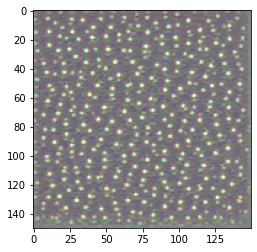

In [ ]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

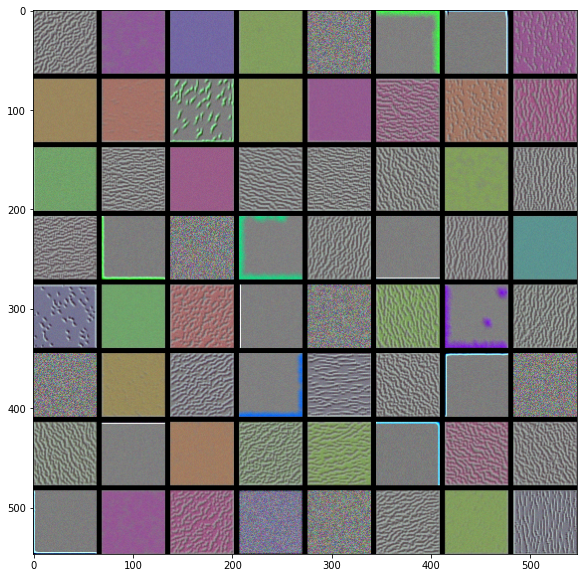

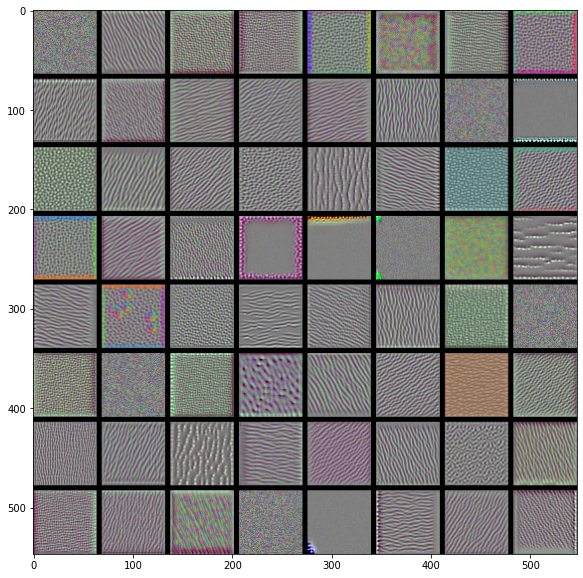

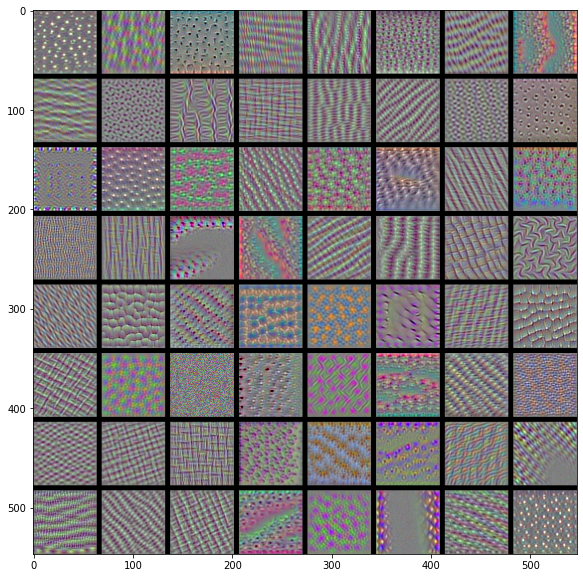

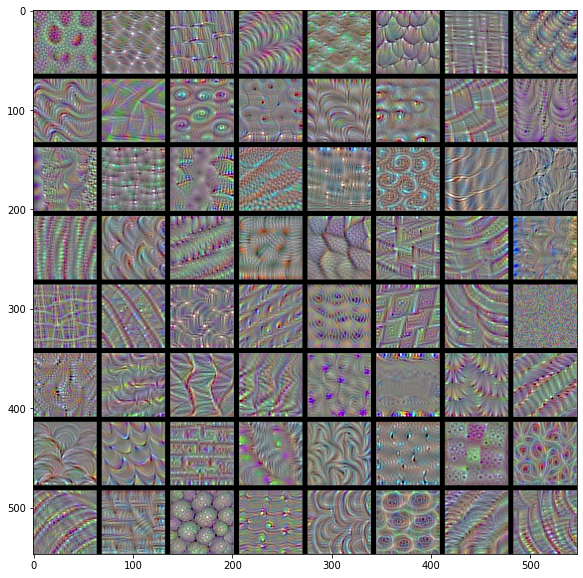

In [ ]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(10, 10))
    plt.imshow(results)
    plt.show()

# ===========================================